## task4_1(Drop out missing columns)

### 预处理

In [31]:
import pandas as pd
import numpy as np
all_data=pd.read_csv('PRSA_data.csv')

In [32]:
#Four dummy variables are introduced to deal with 'cbwd'
all_data['cvornot']=all_data['cbwd']=='cv'
for i in range(len(all_data)):
    if all_data['cvornot'][i]==True:
        all_data['cvornot'][i]=1
    else:
        all_data['cvornot'][i]=0

all_data['NEornot']=all_data['cbwd']=='NE'
for i in range(len(all_data)):
    if all_data['NEornot'][i]==True:
        all_data['NEornot'][i]=1
    else:
        all_data['NEornot'][i]=0

all_data['NWornot']=all_data['cbwd']=='NW'
for i in range(len(all_data)):
    if all_data['NWornot'][i]==True:
        all_data['NWornot'][i]=1
    else:
        all_data['NWornot'][i]=0

all_data['SEornot']=all_data['cbwd']=='SE'
for i in range(len(all_data)):
    if all_data['SEornot'][i]==True:
        all_data['SEornot'][i]=1
    else:
        all_data['SEornot'][i]=0

C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/3183737851.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['cvornot'][i]=0
d:\Program Files\anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/3183737851.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['NEornot'][i

In [33]:
all_data['nightornot']=all_data['hour']<6 #treat 0 1 2 3 4 5 as night
for i in range(len(all_data)):
    if all_data['nightornot'][i]==True:
        all_data['nightornot'][i]=1
    else:
        all_data['nightornot'][i]=0

all_data['morningornot']=(all_data['hour']>5)&(all_data['hour']<12)  #treat 6 7 8 9 10 11 as morning
for i in range(len(all_data)):
    if all_data['morningornot'][i]==True:
        all_data['morningornot'][i]=1
    else:
        all_data['morningornot'][i]=0

all_data['afternoonornot']=(all_data['hour']>11)&(all_data['hour']<18)  #treat 12 13 14 15 16 17 as afternoon 
for i in range(len(all_data)):
    if all_data['afternoonornot'][i]==True:
        all_data['afternoonornot'][i]=1
    else:
        all_data['afternoonornot'][i]=0

all_data['eveningornot']=(all_data['hour']>17)  #treat 18 19 20 21 22 23 24 as evening
for i in range(len(all_data)):
    if all_data['eveningornot'][i]==True:
        all_data['eveningornot'][i]=1
    else:
        all_data['eveningornot'][i]=0

C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/397320567.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['nightornot'][i]=1
C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/397320567.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['morningornot'][i]=0
C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/397320567.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['afternoonornot'][i]=0
C:\Users\lzh\AppD

In [34]:
from datetime import date
all_data['weekdaysornot']=all_data['hour']<6
for i in range(len(all_data)):
    a=all_data['year'][i]
    b=all_data['month'][i]
    c=all_data['day'][i]
    if (date(a,b,c).weekday()==0) or (date(a,b,c).weekday()==1) or (date(a,b,c).weekday()==2) or (date(a,b,c).weekday()==3) or (date(a,b,c).weekday()==4):
        all_data['weekdaysornot'][i]=1
    else:
        all_data['weekdaysornot'][i]=0
#节假日也归为weekends
for i in range(len(all_data)):
    if (all_data['month'][i]==5)and(all_data['day'][i]==1 or all_data['day'][i]==2 or all_data['day'][i]==3):
        all_data['weekdaysornot'][i]=0
    if (all_data['month'][i]==10)and(all_data['day'][i]==1 or all_data['day'][i]==2 or all_data['day'][i]==3 or all_data['day'][i]==4 or all_data['day'][i]==5 or all_data['day'][i]==6 or all_data['day'][i]==7):
        all_data['weekdaysornot'][i]=0
    if (all_data['year'][i]==2010)and(all_data['month'][i]==1)and(all_data['day'][i]>7)and(all_data['day'][i]<20):
        all_data['weekdaysornot'][i]=0
    if (all_data['year'][i]==2011)and(all_data['month'][i]==1)and(all_data['day'][i]>28)and(all_data['day'][i]<31):
        all_data['weekdaysornot'][i]=0
    if (all_data['year'][i]==2011)and(all_data['month'][i]==2)and(all_data['day'][i]>0)and(all_data['day'][i]<9):
        all_data['weekdaysornot'][i]=0
    if (all_data['year'][i]==2012)and(all_data['month'][i]==1)and(all_data['day'][i]>18)and(all_data['day'][i]<29):
        all_data['weekdaysornot'][i]=0
    if (all_data['year'][i]==2013)and(all_data['month'][i]==2)and(all_data['day'][i]>5)and(all_data['day'][i]<16):
        all_data['weekdaysornot'][i]=0
    if (all_data['year'][i]==2014)and(all_data['month'][i]==1)and(all_data['day'][i]>25)and(all_data['day'][i]<31):
        all_data['weekdaysornot'][i]=0
    if (all_data['year'][i]==2014)and(all_data['month'][i]==2)and(all_data['day'][i]>0)and(all_data['day'][i]<6):
        all_data['weekdaysornot'][i]=0


C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/4118274022.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['weekdaysornot'][i]=1


In [35]:
all_data['before_police_or_not']=all_data['year']<2014  #考虑政策影响
for i in range(len(all_data)):
    if all_data['before_police_or_not'][i]==True:
        all_data['before_police_or_not'][i]=1
    else:
        all_data['before_police_or_not'][i]=0

C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/2693529844.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['before_police_or_not'][i]=1


In [36]:
#考虑季节和供暖期，月份划分为这几个种类：4-5（春）  6-9（夏） 10（秋，但农民收获季） 11（秋，供暖） 12-3（冬，供暖）
all_data['month_class_one_or_not']=all_data['month']==0
for i in range(len(all_data)):
    if (all_data['month'][i]>3)&(all_data['month'][i]<6):
        all_data['month_class_one_or_not'][i]=1
    else:
        all_data['month_class_one_or_not'][i]=0

all_data['month_class_two_or_not']=all_data['month']==0
for i in range(len(all_data)):
    if (all_data['month'][i]>5)&(all_data['month'][i]<10):
        all_data['month_class_two_or_not'][i]=1
    else:
        all_data['month_class_two_or_not'][i]=0

all_data['month_class_three_or_not']=all_data['month']==10
for i in range(len(all_data)):
    if all_data['month_class_three_or_not'][i]==True:
        all_data['month_class_three_or_not'][i]=1
    else:
        all_data['month_class_three_or_not'][i]=0

all_data['month_class_four_or_not']=all_data['month']==11
for i in range(len(all_data)):
    if all_data['month_class_four_or_not'][i]==True:
        all_data['month_class_four_or_not'][i]=1
    else:
        all_data['month_class_four_or_not'][i]=0

all_data['month_class_five_or_not']=all_data['month']==0
for i in range(len(all_data)):
    if (all_data['month'][i]>11)|(all_data['month'][i]<4):
        all_data['month_class_five_or_not'][i]=1
    else:
        all_data['month_class_five_or_not'][i]=0

C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/3193024643.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['month_class_one_or_not'][i]=0
C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/3193024643.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['month_class_two_or_not'][i]=0
C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/3193024643.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['month_class_th

In [37]:
#delete the missing data
all_data=all_data.dropna(how='any')

In [38]:
#用lof算法识别离群值,并除去
from sklearn.neighbors import LocalOutlierFactor
model= LocalOutlierFactor(n_neighbors=60, contamination=0.2)  #由于样本数量较多，我们保留约五分之四的数据
all_data['outlierornot']=model._fit_predict(all_data.iloc[:,[5,6,7,8,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27]])
for i in all_data.index:
    if all_data['outlierornot'][i]==-1:
        all_data.drop(index=i,inplace=True)
for i in all_data.index:
    if ((all_data['pm2.5'][i]==0)|(all_data['pm2.5'][i]<0)):
        all_data.drop(index=i,inplace=True)

In [39]:
#splitting data to X and y & do logarithm transformation on y
from scipy import stats
all_data_X=all_data[['DEWP','TEMP','PRES','Iws','Is','Ir','cvornot','NEornot','NWornot','SEornot','nightornot','morningornot','afternoonornot','eveningornot','weekdaysornot','before_police_or_not','month_class_one_or_not','month_class_two_or_not','month_class_three_or_not','month_class_four_or_not','month_class_five_or_not']]
all_data_y=all_data[['year','month','day','pm2.5']]
all_data_y['pm2.5']=np.log(all_data['pm2.5'])

C:\Users\lzh\AppData\Local\Temp/ipykernel_18892/1606246903.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data_y['pm2.5']=np.log(all_data['pm2.5'])


In [40]:
#normalize
import sklearn.preprocessing as pre
all_data_X = pre.scale( all_data_X)

### PCA

In [41]:
# PCA 选择x变量(待选择多个)
from sklearn import decomposition

n_component = 21
pca = decomposition.PCA(n_components=n_component )
all_data_X_21 = pca.fit_transform(all_data_X) 

# 先查看不同方向上的var大小，可见可以去掉最后三个特征
print(pca.explained_variance_)
# 查看降维后每个新特征向量所占的信息量占原始数据总信息量的百分比
print(pca.explained_variance_ratio_)


[4.32995016e+00 1.73505667e+00 1.56002046e+00 1.35722620e+00
 1.33435922e+00 1.29625200e+00 1.24233389e+00 1.13370653e+00
 1.11024355e+00 1.02886802e+00 9.96205066e-01 9.69842491e-01
 9.66369726e-01 8.95353361e-01 6.53883849e-01 2.19023163e-01
 9.43989944e-02 7.75353145e-02 1.54677746e-31 5.89195077e-32
 4.36365481e-32]
[2.06181931e-01 8.26192728e-02 7.42844648e-02 6.46278841e-02
 6.35390130e-02 6.17244381e-02 5.91569859e-02 5.39844091e-02
 5.28671577e-02 4.89922486e-02 4.74369164e-02 4.61815933e-02
 4.60162284e-02 4.26345980e-02 3.11363941e-02 1.04293622e-02
 4.49505564e-03 3.69204731e-03 7.36538645e-33 2.80560685e-33
 2.07786866e-33]


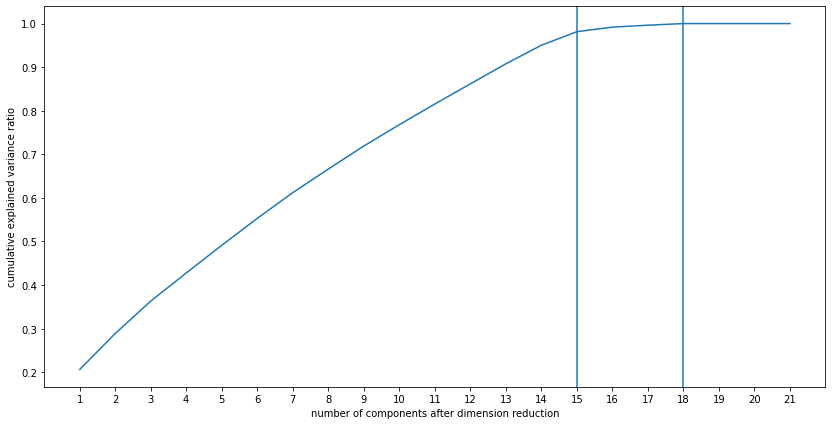

In [43]:
# 选择最好的n_components：累积可解释方差贡献率曲线
import matplotlib.pyplot as plt
plt.rc('figure', figsize = (14, 7))
plt.plot(range(1,22),np.cumsum(pca.explained_variance_ratio_))
plt.xticks(range(1,22)) #这是为了限制坐标轴显示为整数
plt.xlabel("number of components after dimension reduction")
plt.ylabel("cumulative explained variance ratio")
plt.axvline(18)
plt.axvline(15)
plt.show()

### 尝试选择前18个方差最大的变量

In [13]:
# 尝试选择前18个方差最大的变量
n_component = 18
pca = decomposition.PCA(n_components=n_component )
all_data_X_18 = pca.fit_transform(all_data_X) 
all_data_X_18 = pd.DataFrame(all_data_X_18)
all_data_X_18.index=all_data.index

In [14]:
#divide all data into training set and test set
import copy
from datetime import date
train_data_task2_X=copy.deepcopy(pd.DataFrame(all_data_X_18))
test_data_task2_X=copy.deepcopy(pd.DataFrame(all_data_X_18))

train_data_task2_y=copy.deepcopy(all_data_y)
test_data_task2_y=copy.deepcopy(all_data_y)
for i in all_data.index:
   if date(all_data['year'][i],all_data['month'][i],all_data['day'][i]).weekday()==3:
      train_data_task2_X.drop(index=i,inplace=True)
      train_data_task2_y.drop(index=i,inplace=True)
   else:
      test_data_task2_X.drop(index=i,inplace=True)
      test_data_task2_y.drop(index=i,inplace=True)

In [15]:
#Do the OLS regression required in task 2
from sklearn.linear_model import LinearRegression
lm=LinearRegression()
lm.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lm.score(train_data_task2_X,train_data_task2_y['pm2.5']),lm.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.5602751098902001, 0.5443339535991121)

In [16]:
#Ridge regression
from sklearn.linear_model import Ridge
lr=Ridge()
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.5602750760377502, 0.5443349350180016)

In [17]:
#Ridge with CV
from sklearn.linear_model import RidgeCV
alphas=np.logspace(-10,10,200)  
lr_cv=RidgeCV(alphas=alphas).fit(train_data_task2_X,train_data_task2_y['pm2.5'])  
lr=Ridge(lr_cv.alpha_)
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.5602750830291703, 0.5443348308676594)

In [17]:
#LASSO regression
from sklearn.linear_model import Lasso
la=Lasso()
la.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
la.score(train_data_task2_X,train_data_task2_y['pm2.5']),la.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.3076518044344966, 0.3245999208448552)

In [18]:
#catboost
from catboost import CatBoostRegressor
score=pd.DataFrame(columns=['learning_rate','score'])
for i in range(-10,11):
    # ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=0.03982+i*0.0001/20)
    ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=0.035+i*0.0001)
    ctr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
    new=pd.DataFrame({'learning_rate':0.035+i*0.0001,'score':ctr.score(test_data_task2_X,test_data_task2_y['pm2.5'])},index=[1])
    score=score.append(new,ignore_index=True)

0:	learn: 1.0003395	total: 166ms	remaining: 4m 8s
1:	learn: 0.9861390	total: 171ms	remaining: 2m 7s
2:	learn: 0.9728720	total: 176ms	remaining: 1m 27s
3:	learn: 0.9596500	total: 181ms	remaining: 1m 7s
4:	learn: 0.9473335	total: 186ms	remaining: 55.7s
5:	learn: 0.9356517	total: 192ms	remaining: 47.7s
6:	learn: 0.9242357	total: 196ms	remaining: 41.9s
7:	learn: 0.9134523	total: 202ms	remaining: 37.7s
8:	learn: 0.9031691	total: 208ms	remaining: 34.4s
9:	learn: 0.8934503	total: 214ms	remaining: 31.9s
10:	learn: 0.8838820	total: 220ms	remaining: 29.7s
11:	learn: 0.8745030	total: 225ms	remaining: 28s
12:	learn: 0.8660752	total: 232ms	remaining: 26.5s
13:	learn: 0.8575784	total: 237ms	remaining: 25.2s
14:	learn: 0.8492363	total: 243ms	remaining: 24s
15:	learn: 0.8416684	total: 249ms	remaining: 23.1s
16:	learn: 0.8344108	total: 254ms	remaining: 22.2s
17:	learn: 0.8274120	total: 259ms	remaining: 21.4s
18:	learn: 0.8207612	total: 267ms	remaining: 20.8s
19:	learn: 0.8141546	total: 272ms	remaining:

In [19]:
score

,learning_rate,score
0,0.0340,0.652241
1,0.0341,0.651587
2,0.0342,0.651719
3,0.0343,0.652163
4,0.0344,0.652354
5,0.0345,0.651607
6,0.0346,0.653627
7,0.0347,0.651266
8,0.0348,0.651043
9,0.0349,0.650583


In [20]:
ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=0.039770)
ctr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
ctr.score(train_data_task2_X,train_data_task2_y['pm2.5']),ctr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

0:	learn: 0.9979231	total: 14.5ms	remaining: 21.7s
1:	learn: 0.9814673	total: 21ms	remaining: 15.7s
2:	learn: 0.9662212	total: 26.3ms	remaining: 13.1s
3:	learn: 0.9511482	total: 31.3ms	remaining: 11.7s
4:	learn: 0.9372127	total: 37.4ms	remaining: 11.2s
5:	learn: 0.9237801	total: 42.6ms	remaining: 10.6s
6:	learn: 0.9110598	total: 48.1ms	remaining: 10.3s
7:	learn: 0.8992062	total: 54ms	remaining: 10.1s
8:	learn: 0.8879630	total: 59.5ms	remaining: 9.85s
9:	learn: 0.8773596	total: 64.8ms	remaining: 9.65s
10:	learn: 0.8670253	total: 70.8ms	remaining: 9.58s
11:	learn: 0.8569563	total: 75.8ms	remaining: 9.4s
12:	learn: 0.8478248	total: 81.1ms	remaining: 9.28s
13:	learn: 0.8387077	total: 86.8ms	remaining: 9.21s
14:	learn: 0.8299817	total: 91.9ms	remaining: 9.1s
15:	learn: 0.8218739	total: 97.4ms	remaining: 9.03s
16:	learn: 0.8143052	total: 104ms	remaining: 9.09s
17:	learn: 0.8070357	total: 109ms	remaining: 9s
18:	learn: 0.8002602	total: 115ms	remaining: 8.97s
19:	learn: 0.7939033	total: 120ms	

(0.7646457352986876, 0.6513952578040145)

### 尝试选择前15个方差最大的变量

In [21]:
# 尝试选择前15个方差最大的变量
n_component = 15
pca = decomposition.PCA(n_components=n_component )
all_data_X_15 = pca.fit_transform(all_data_X) 
all_data_X_15 = pd.DataFrame(all_data_X_15)
all_data_X_15.index=all_data.index

In [22]:
#divide all data into training set and test set
import copy
from datetime import date
train_data_task2_X=copy.deepcopy(pd.DataFrame(all_data_X_15))
test_data_task2_X=copy.deepcopy(pd.DataFrame(all_data_X_15))

train_data_task2_y=copy.deepcopy(all_data_y)
test_data_task2_y=copy.deepcopy(all_data_y)
for i in all_data.index:
   if date(all_data['year'][i],all_data['month'][i],all_data['day'][i]).weekday()==3:
      train_data_task2_X.drop(index=i,inplace=True)
      train_data_task2_y.drop(index=i,inplace=True)
   else:
      test_data_task2_X.drop(index=i,inplace=True)
      test_data_task2_y.drop(index=i,inplace=True)

In [23]:
#Do the OLS regression required in task 2
from sklearn.linear_model import LinearRegression
lm=LinearRegression()
lm.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lm.score(train_data_task2_X,train_data_task2_y['pm2.5']),lm.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.290684116282811, 0.3002740311590747)

In [24]:
#Ridge regression
from sklearn.linear_model import Ridge
lr=Ridge()
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.2906841160718392, 0.30027543876677965)

In [25]:
#Ridge with CV
from sklearn.linear_model import RidgeCV
alphas=np.logspace(-10,10,200)  
lr_cv=RidgeCV(alphas=alphas).fit(train_data_task2_X,train_data_task2_y['pm2.5'])  
lr=Ridge(lr_cv.alpha_)
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.29068301799566876, 0.3003742658953076)

In [26]:
#LASSO regression
from sklearn.linear_model import Lasso
la=Lasso()
la.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
la.score(train_data_task2_X,train_data_task2_y['pm2.5']),la.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.0, -0.0006580683534762599)

In [27]:
#catboost
from catboost import CatBoostRegressor
score_15=pd.DataFrame(columns=['learning_rate','score'])
for i in range(-10,11):
    # ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=0.03982+i*0.0001/20)
    learning_rate = 0.03561+i*0.000001
    ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=learning_rate)
    ctr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
    new=pd.DataFrame({'learning_rate':learning_rate,'score':ctr.score(test_data_task2_X,test_data_task2_y['pm2.5'])},index=[1])
    score_15=score_15.append(new,ignore_index=True)



0:	learn: 1.0044432	total: 5.68ms	remaining: 8.51s
1:	learn: 0.9948838	total: 11.3ms	remaining: 8.43s
2:	learn: 0.9853725	total: 16.8ms	remaining: 8.39s
3:	learn: 0.9764052	total: 21.9ms	remaining: 8.17s
4:	learn: 0.9675551	total: 26.9ms	remaining: 8.03s
5:	learn: 0.9594500	total: 32.5ms	remaining: 8.08s
6:	learn: 0.9515644	total: 37.6ms	remaining: 8.02s
7:	learn: 0.9445185	total: 42.7ms	remaining: 7.96s
8:	learn: 0.9377510	total: 48.4ms	remaining: 8.02s
9:	learn: 0.9311808	total: 53.3ms	remaining: 7.94s
10:	learn: 0.9250379	total: 58.8ms	remaining: 7.96s
11:	learn: 0.9192525	total: 64.4ms	remaining: 7.98s
12:	learn: 0.9135571	total: 69.6ms	remaining: 7.96s
13:	learn: 0.9082877	total: 74.4ms	remaining: 7.9s
14:	learn: 0.9030532	total: 80.2ms	remaining: 7.94s
15:	learn: 0.8984616	total: 85.3ms	remaining: 7.91s
16:	learn: 0.8938261	total: 90.3ms	remaining: 7.88s
17:	learn: 0.8891492	total: 96ms	remaining: 7.9s
18:	learn: 0.8847946	total: 101ms	remaining: 7.88s
19:	learn: 0.8806942	total:

In [28]:
print(score_15)

    learning_rate     score
0        0.035600  0.563450
1        0.035601  0.564320
2        0.035602  0.563566
3        0.035603  0.562869
4        0.035604  0.561952
5        0.035605  0.562033
6        0.035606  0.564526
7        0.035607  0.562829
8        0.035608  0.563383
9        0.035609  0.562420
10       0.035610  0.563446
11       0.035611  0.561198
12       0.035612  0.562606
13       0.035613  0.563342
14       0.035614  0.561575
15       0.035615  0.562140
16       0.035616  0.561517
17       0.035617  0.562070
18       0.035618  0.562049
19       0.035619  0.562908
20       0.035620  0.562922


In [29]:
ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=0.0356099)
ctr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
ctr.score(train_data_task2_X,train_data_task2_y['pm2.5']),ctr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

0:	learn: 1.0044404	total: 7.08ms	remaining: 10.6s
1:	learn: 0.9948785	total: 17.5ms	remaining: 13.1s
2:	learn: 0.9853649	total: 27.8ms	remaining: 13.9s
3:	learn: 0.9763955	total: 34.4ms	remaining: 12.9s
4:	learn: 0.9675435	total: 40.4ms	remaining: 12.1s
5:	learn: 0.9594368	total: 45.7ms	remaining: 11.4s
6:	learn: 0.9515498	total: 51ms	remaining: 10.9s
7:	learn: 0.9445026	total: 56.8ms	remaining: 10.6s
8:	learn: 0.9377341	total: 62.4ms	remaining: 10.3s
9:	learn: 0.9311630	total: 67.1ms	remaining: 9.99s
10:	learn: 0.9250193	total: 72.1ms	remaining: 9.76s
11:	learn: 0.9192333	total: 76.1ms	remaining: 9.44s
12:	learn: 0.9135374	total: 80.6ms	remaining: 9.22s
13:	learn: 0.9082675	total: 84.7ms	remaining: 8.98s
14:	learn: 0.9030326	total: 89.8ms	remaining: 8.89s
15:	learn: 0.8984407	total: 93.9ms	remaining: 8.71s
16:	learn: 0.8938050	total: 98.1ms	remaining: 8.56s
17:	learn: 0.8891280	total: 103ms	remaining: 8.46s
18:	learn: 0.8847733	total: 107ms	remaining: 8.32s
19:	learn: 0.8806727	total

(0.6863687916471175, 0.5622839430286952)

In [45]:
ctr.feature_names_

['0',
 '1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 '10',
 '11',
 '12',
 '13',
 '14']

### 尝试选择前4个方差最大的变量

In [30]:
# 尝试选择前4个方差最大的变量
n_component = 4
pca = decomposition.PCA(n_components=n_component )
all_data_X_4 = pca.fit_transform(all_data_X) 
all_data_X_4 = pd.DataFrame(all_data_X_4)
all_data_X_4.index=all_data.index

In [31]:
# labeling the plot
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}
labels

{'0': 'PC 1 (84.3%)',
 '1': 'PC 2 (14.0%)',
 '2': 'PC 3 (1.0%)',
 '3': 'PC 4 (0.6%)'}

In [32]:
#divide all data into training set and test set
import copy
from datetime import date
train_data_task2_X=copy.deepcopy(pd.DataFrame(all_data_X_4))
test_data_task2_X=copy.deepcopy(pd.DataFrame(all_data_X_4))

train_data_task2_y=copy.deepcopy(all_data_y)
test_data_task2_y=copy.deepcopy(all_data_y)
for i in all_data.index:
   if date(all_data['year'][i],all_data['month'][i],all_data['day'][i]).weekday()==3:
      train_data_task2_X.drop(index=i,inplace=True)
      train_data_task2_y.drop(index=i,inplace=True)
   else:
      test_data_task2_X.drop(index=i,inplace=True)
      test_data_task2_y.drop(index=i,inplace=True)

In [33]:
#Do the OLS regression required in task 2
from sklearn.linear_model import LinearRegression
lm=LinearRegression()
lm.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lm.score(train_data_task2_X,train_data_task2_y['pm2.5']),lm.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.4062314515111508, 0.40860340285702)

In [34]:
#Ridge regression
from sklearn.linear_model import Ridge
lr=Ridge()
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.4062314515105441, 0.4086034282864863)

In [35]:
#Ridge with CV
from sklearn.linear_model import RidgeCV
alphas=np.logspace(-10,10,200)  
lr_cv=RidgeCV(alphas=alphas).fit(train_data_task2_X,train_data_task2_y['pm2.5'])  
lr=Ridge(lr_cv.alpha_)
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.40623144647250575, 0.4086057155351138)

In [36]:
#LASSO regression
from sklearn.linear_model import Lasso
la=Lasso()
la.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
la.score(train_data_task2_X,train_data_task2_y['pm2.5']),la.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.3076518044338812, 0.3245999208445437)

In [37]:
#catboost
from catboost import CatBoostRegressor
score_4=pd.DataFrame(columns=['learning_rate','score'])
for i in range(-10,11):
    # ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=0.03982+i*0.0001/20)
    learning_rate = 0.0445+i*0.00001
    ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=learning_rate)
    ctr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
    new=pd.DataFrame({'learning_rate':learning_rate,'score':ctr.score(test_data_task2_X,test_data_task2_y['pm2.5'])},index=[1])
    score_4=score_4.append(new,ignore_index=True)



0:	learn: 0.9977710	total: 3.7ms	remaining: 5.55s
1:	learn: 0.9816528	total: 7.42ms	remaining: 5.56s
2:	learn: 0.9668563	total: 11.4ms	remaining: 5.69s
3:	learn: 0.9528546	total: 15ms	remaining: 5.6s
4:	learn: 0.9391941	total: 18.5ms	remaining: 5.52s
5:	learn: 0.9265243	total: 21.9ms	remaining: 5.46s
6:	learn: 0.9147043	total: 25.7ms	remaining: 5.49s
7:	learn: 0.9036844	total: 29.3ms	remaining: 5.46s
8:	learn: 0.8937251	total: 32.8ms	remaining: 5.43s
9:	learn: 0.8841158	total: 36.2ms	remaining: 5.4s
10:	learn: 0.8746921	total: 39.6ms	remaining: 5.37s
11:	learn: 0.8655280	total: 43.8ms	remaining: 5.42s
12:	learn: 0.8574190	total: 47.3ms	remaining: 5.41s
13:	learn: 0.8500515	total: 50.8ms	remaining: 5.39s
14:	learn: 0.8429615	total: 54.2ms	remaining: 5.37s
15:	learn: 0.8361260	total: 58.4ms	remaining: 5.42s
16:	learn: 0.8299217	total: 62ms	remaining: 5.41s
17:	learn: 0.8241429	total: 65.5ms	remaining: 5.39s
18:	learn: 0.8185419	total: 68.9ms	remaining: 5.37s
19:	learn: 0.8130245	total: 7

In [38]:
print(score_4)

    learning_rate     score
0         0.04440  0.537054
1         0.04441  0.537134
2         0.04442  0.536443
3         0.04443  0.536305
4         0.04444  0.537175
5         0.04445  0.536773
6         0.04446  0.535081
7         0.04447  0.535813
8         0.04448  0.536444
9         0.04449  0.536593
10        0.04450  0.535928
11        0.04451  0.535341
12        0.04452  0.536747
13        0.04453  0.536383
14        0.04454  0.538048
15        0.04455  0.536749
16        0.04456  0.535920
17        0.04457  0.536725
18        0.04458  0.538067
19        0.04459  0.536759
20        0.04460  0.537343


In [39]:
ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=0.0356099)
ctr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
ctr.score(train_data_task2_X,train_data_task2_y['pm2.5']),ctr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

0:	learn: 1.0010936	total: 4.24ms	remaining: 6.36s
1:	learn: 0.9879622	total: 8.37ms	remaining: 6.27s
2:	learn: 0.9757493	total: 12.4ms	remaining: 6.18s
3:	learn: 0.9640405	total: 16.1ms	remaining: 6.01s
4:	learn: 0.9523799	total: 20ms	remaining: 5.99s
5:	learn: 0.9418336	total: 23.8ms	remaining: 5.93s
6:	learn: 0.9313163	total: 27.5ms	remaining: 5.87s
7:	learn: 0.9214303	total: 31.1ms	remaining: 5.8s
8:	learn: 0.9121128	total: 35.7ms	remaining: 5.91s
9:	learn: 0.9034809	total: 39.4ms	remaining: 5.86s
10:	learn: 0.8955519	total: 43.2ms	remaining: 5.85s
11:	learn: 0.8873435	total: 47.1ms	remaining: 5.84s
12:	learn: 0.8798900	total: 51.4ms	remaining: 5.88s
13:	learn: 0.8730724	total: 55.3ms	remaining: 5.87s
14:	learn: 0.8661518	total: 59ms	remaining: 5.84s
15:	learn: 0.8597572	total: 62.7ms	remaining: 5.81s
16:	learn: 0.8539273	total: 66.4ms	remaining: 5.79s
17:	learn: 0.8482328	total: 70.4ms	remaining: 5.79s
18:	learn: 0.8426107	total: 74ms	remaining: 5.77s
19:	learn: 0.8373102	total: 7

(0.5952200538985379, 0.5379217938233931)

## Kernel PCA

In [ ]:
#kernel PCA
n_component = 4

pca_kernel = decomposition.KernelPCA(
    n_components=n_component, kernel='rbf', gamma=0.01)
slice_X = all_data_X.iloc[0:30000,:]
X_kernel_pca = pca_kernel.fit_transform(slice_X) 
X_kernel_pca = pd.DataFrame(X_kernel_pca)

In [ ]:
X_kernel_pca.set_index(all_data.iloc[0:30000,:].index)


RangeIndex(start=0, stop=30000, step=1)

In [ ]:
#divide all data into training set and test set
import copy
from datetime import date
train_data_task2_X=copy.deepcopy(pd.DataFrame(X_kernel_pca))
train_data_task2_X.index = (all_data.iloc[0:30000,:].index)
test_data_task2_X=copy.deepcopy(pd.DataFrame(X_kernel_pca))
test_data_task2_X.index = (all_data.iloc[0:30000,:].index)

train_data_task2_y=copy.deepcopy(all_data_y.iloc[0:30000,:])
test_data_task2_y=copy.deepcopy(all_data_y.iloc[0:30000,:])
slice_data = all_data.iloc[0:30000,:]

for i in slice_data.index:
   if date(all_data['year'][i],all_data['month'][i],all_data['day'][i]).weekday()==3:
      train_data_task2_X.drop(index=i,inplace=True)
      train_data_task2_y.drop(index=i,inplace=True)
   else:
      test_data_task2_X.drop(index=i,inplace=True)
      test_data_task2_y.drop(index=i,inplace=True)

In [ ]:
#Do the OLS regression required in task 2
from sklearn.linear_model import LinearRegression
lm=LinearRegression()
lm.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lm.score(train_data_task2_X,train_data_task2_y['pm2.5']),lm.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.1993925613619697, 0.21435924009799556)

In [ ]:
#Ridge regression
from sklearn.linear_model import Ridge
lr=Ridge()
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.19939240860765417, 0.21432177009511344)

### 效果不好，换用其他

## LLE

In [ ]:
from sklearn import manifold

n_component = 5
lle = manifold.LocallyLinearEmbedding(
    n_components=n_component, n_neighbors=30, method='standard'
)
X_lle = lle.fit_transform(all_data_X)
X_lle = pd.DataFrame(X_lle)
X_lle.index = all_data_X.index

In [ ]:
#divide all data into training set and test set
import copy
from datetime import date
train_data_task2_X=copy.deepcopy(X_lle)
test_data_task2_X=copy.deepcopy(X_lle)

train_data_task2_y=copy.deepcopy(all_data_y)
test_data_task2_y=copy.deepcopy(all_data_y)
for i in all_data.index:
   if date(all_data['year'][i],all_data['month'][i],all_data['day'][i]).weekday()==3:
      train_data_task2_X.drop(index=i,inplace=True)
      train_data_task2_y.drop(index=i,inplace=True)
   else:
      test_data_task2_X.drop(index=i,inplace=True)
      test_data_task2_y.drop(index=i,inplace=True)

In [ ]:
#Do the OLS regression required in task 2
from sklearn.linear_model import LinearRegression
lm=LinearRegression()
lm.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lm.score(train_data_task2_X,train_data_task2_y['pm2.5']),lm.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.36494450326681005, 0.4015315865556618)

In [ ]:
#Ridge regression
from sklearn.linear_model import Ridge
lr=Ridge()
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.25777287430767926, 0.27967250052542825)

In [ ]:
#Ridge with CV
from sklearn.linear_model import RidgeCV
alphas=np.logspace(-10,10,200)  
lr_cv=RidgeCV(alphas=alphas).fit(train_data_task2_X,train_data_task2_y['pm2.5'])  
lr=Ridge(lr_cv.alpha_)
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.3649444090216405, 0.40152418913692045)

In [ ]:
#LASSO regression
from sklearn.linear_model import Lasso
la=Lasso()
la.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
la.score(train_data_task2_X,train_data_task2_y['pm2.5']),la.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.0, -0.0006580683534762599)

In [ ]:
#catboost
from catboost import CatBoostRegressor
score_4=pd.DataFrame(columns=['learning_rate','score'])
for i in range(-10,11):
    # ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=0.03982+i*0.0001/20)
    learning_rate = 0.0445+i*0.00001
    ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=learning_rate)
    ctr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
    new=pd.DataFrame({'learning_rate':learning_rate,'score':ctr.score(test_data_task2_X,test_data_task2_y['pm2.5'])},index=[1])
    score_4=score_4.append(new,ignore_index=True)



0:	learn: 0.9970015	total: 18.4ms	remaining: 27.6s
1:	learn: 0.9801782	total: 22.3ms	remaining: 16.7s
2:	learn: 0.9647529	total: 32.7ms	remaining: 16.3s
3:	learn: 0.9496886	total: 36.5ms	remaining: 13.7s
4:	learn: 0.9354614	total: 40.6ms	remaining: 12.1s
5:	learn: 0.9230796	total: 44.4ms	remaining: 11.1s
6:	learn: 0.9106871	total: 48.4ms	remaining: 10.3s
7:	learn: 0.8991575	total: 52.1ms	remaining: 9.71s
8:	learn: 0.8885316	total: 56.5ms	remaining: 9.36s
9:	learn: 0.8784375	total: 60.1ms	remaining: 8.96s
10:	learn: 0.8691319	total: 64.6ms	remaining: 8.74s
11:	learn: 0.8602571	total: 69.6ms	remaining: 8.63s
12:	learn: 0.8523140	total: 74.5ms	remaining: 8.52s
13:	learn: 0.8446674	total: 78.4ms	remaining: 8.33s
14:	learn: 0.8373998	total: 82.5ms	remaining: 8.16s
15:	learn: 0.8309069	total: 86.5ms	remaining: 8.02s
16:	learn: 0.8249456	total: 91.3ms	remaining: 7.97s
17:	learn: 0.8191720	total: 96ms	remaining: 7.9s


Custom logger is already specified. Specify more than one logger at same time is not thread safe.

18:	learn: 0.8140517	total: 100ms	remaining: 7.81s
19:	learn: 0.8097360	total: 105ms	remaining: 7.78s
20:	learn: 0.8051222	total: 111ms	remaining: 7.79s
21:	learn: 0.8010471	total: 115ms	remaining: 7.72s
22:	learn: 0.7969667	total: 119ms	remaining: 7.62s
23:	learn: 0.7931305	total: 124ms	remaining: 7.62s
24:	learn: 0.7894301	total: 129ms	remaining: 7.59s
25:	learn: 0.7857852	total: 134ms	remaining: 7.57s
26:	learn: 0.7826738	total: 139ms	remaining: 7.57s
27:	learn: 0.7799525	total: 143ms	remaining: 7.5s
28:	learn: 0.7774448	total: 146ms	remaining: 7.41s
29:	learn: 0.7748245	total: 150ms	remaining: 7.33s
30:	learn: 0.7722274	total: 155ms	remaining: 7.32s
31:	learn: 0.7699306	total: 158ms	remaining: 7.26s
32:	learn: 0.7674966	total: 162ms	remaining: 7.19s
33:	learn: 0.7654190	total: 166ms	remaining: 7.15s
34:	learn: 0.7635663	total: 170ms	remaining: 7.14s
35:	learn: 0.7613972	total: 174ms	remaining: 7.09s
36:	learn: 0.7597624	total: 178ms	remaining: 7.03s
37:	learn: 0.7577234	total: 181m

In [ ]:
score_4

,learning_rate,score
0,0.04440,0.537209
1,0.04441,0.536680
2,0.04442,0.536354
3,0.04443,0.537099
4,0.04444,0.535668
5,0.04445,0.538628
6,0.04446,0.537841
7,0.04447,0.536659
8,0.04448,0.537624
9,0.04449,0.536746


## ISOMAP

In [ ]:
# ISOMAP
from sklearn import manifold
n_component=4
ISOMAP= manifold.Isomap(
    n_components=n_component, n_neighbors=20
)
slice_X = all_data_X.iloc[0:20000,:]
X_ISOMAP = ISOMAP.fit_transform(slice_X)
X_ISOMAP = pd.DataFrame(X_ISOMAP)


In [ ]:
X_ISOMAP.index = all_data_X.iloc[0:20000,:].index


Int64Index([   24,    25,    26,    27,    28,    34,    35,    36,    37,
               38,
            ...
            27139, 27140, 27141, 27142, 27143, 27144, 27145, 27146, 27147,
            27148],
           dtype='int64', length=20000)

In [ ]:
#divide all data into training set and test set
import copy
from datetime import date
train_data_task2_X=copy.deepcopy(X_ISOMAP)
test_data_task2_X=copy.deepcopy(X_ISOMAP)

train_data_task2_y=copy.deepcopy(all_data_y.iloc[0:20000,:])
test_data_task2_y=copy.deepcopy(all_data_y.iloc[0:20000,:])
for i in all_data.iloc[0:20000,:].index:
   if date(all_data['year'][i],all_data['month'][i],all_data['day'][i]).weekday()==3:
      train_data_task2_X.drop(index=i,inplace=True)
      train_data_task2_y.drop(index=i,inplace=True)
   else:
      test_data_task2_X.drop(index=i,inplace=True)
      test_data_task2_y.drop(index=i,inplace=True)

In [ ]:
#Do the OLS regression required in task 2
from sklearn.linear_model import LinearRegression
lm=LinearRegression()
lm.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lm.score(train_data_task2_X,train_data_task2_y['pm2.5']),lm.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.3517601272016573, 0.35009835514708687)

In [ ]:
#Ridge regression
from sklearn.linear_model import Ridge
lr=Ridge()
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.351760127201421, 0.35009831224225607)

In [ ]:
#Ridge with CV
from sklearn.linear_model import RidgeCV
alphas=np.logspace(-10,10,200)  
lr_cv=RidgeCV(alphas=alphas).fit(train_data_task2_X,train_data_task2_y['pm2.5'])  
lr=Ridge(lr_cv.alpha_)
lr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
lr.score(train_data_task2_X,train_data_task2_y['pm2.5']),lr.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.3517600956720014, 0.35008265439319086)

In [ ]:
#LASSO regression
from sklearn.linear_model import Lasso
la=Lasso()
la.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
la.score(train_data_task2_X,train_data_task2_y['pm2.5']),la.score(test_data_task2_X,test_data_task2_y['pm2.5'])

(0.31662889771702163, 0.29889052872735233)

In [ ]:
#catboost
from catboost import CatBoostRegressor
score_4=pd.DataFrame(columns=['learning_rate','score'])
for i in range(-10,11):
    # ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=0.03982+i*0.0001/20)
    learning_rate = 0.0445+i*0.00001
    ctr=CatBoostRegressor(n_estimators=1500,max_depth=6,learning_rate=learning_rate)
    ctr.fit(train_data_task2_X,train_data_task2_y['pm2.5'])
    new=pd.DataFrame({'learning_rate':learning_rate,'score':ctr.score(test_data_task2_X,test_data_task2_y['pm2.5'])},index=[1])
    score_4=score_4.append(new,ignore_index=True)



0:	learn: 1.0043037	total: 159ms	remaining: 3m 58s
1:	learn: 0.9880701	total: 162ms	remaining: 2m 1s
2:	learn: 0.9730575	total: 165ms	remaining: 1m 22s
3:	learn: 0.9593890	total: 168ms	remaining: 1m 2s
4:	learn: 0.9462992	total: 172ms	remaining: 51.4s
5:	learn: 0.9338592	total: 175ms	remaining: 43.6s
6:	learn: 0.9221956	total: 178ms	remaining: 38s
7:	learn: 0.9110085	total: 182ms	remaining: 33.9s
8:	learn: 0.9007999	total: 185ms	remaining: 30.7s
9:	learn: 0.8917569	total: 188ms	remaining: 28.1s
10:	learn: 0.8822967	total: 191ms	remaining: 25.9s
11:	learn: 0.8738477	total: 194ms	remaining: 24.1s
12:	learn: 0.8655074	total: 197ms	remaining: 22.6s
13:	learn: 0.8584588	total: 201ms	remaining: 21.3s
14:	learn: 0.8511401	total: 204ms	remaining: 20.2s
15:	learn: 0.8446677	total: 207ms	remaining: 19.2s
16:	learn: 0.8387748	total: 210ms	remaining: 18.3s
17:	learn: 0.8330468	total: 213ms	remaining: 17.5s
18:	learn: 0.8271665	total: 216ms	remaining: 16.9s
19:	learn: 0.8219546	total: 220ms	remaini

In [ ]:
score_4

,learning_rate,score
0,0.04440,0.480657
1,0.04441,0.480042
2,0.04442,0.481225
3,0.04443,0.480196
4,0.04444,0.481198
5,0.04445,0.481711
6,0.04446,0.480783
7,0.04447,0.481260
8,0.04448,0.480991
9,0.04449,0.482157
